In [3]:
# standard libraries
import pandas as pd
import numpy as np
import os
from IPython.display import Image
#from IPython.display import clear_output
import time
#import re

# visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from tabulate import tabulate


In [ ]:
## todo import graph analyzsing tool


In [4]:
from os import listdir
from os.path import isfile, join

class FilePathManager:
    def __init__(self, local_dir: str):
        self.local_dir = local_dir
    
    def retrieve_full_path(self):
        return os.getcwd()+'/'+self.local_dir


In [6]:
class Loader:
    df = pd.DataFrame()
    
    #@abstractmethod
    def load_data(self, file_name):
        pass
    
    #@abstractmethod
    def get_df(self):
        pass
    
    def size(self):
        return len(self.df)

In [7]:
from typing import Callable
 
class CSVLoader(Loader):
    def __init__(self, file_path_manager: FilePathManager):
        self.file_path_manager = file_path_manager
        
    def load_data(self, _prepare_data: Callable[[pd.DataFrame], pd.DataFrame] = None):
        self.df = pd.read_csv(self.file_path_manager.retrieve_full_path(), low_memory=False)
        if _prepare_data:
            self.df = _prepare_data(self.df)
    
    def get_df(self):
        return self.df;
    
    def size(self):
        return len(self.df)  

In [8]:
def clean_data(df):
    df['Datetime_updated'] = pd.to_datetime(df['Datetime_updated'], infer_datetime_format=True)
    df['Datetime_updated_seconds'] = pd.to_datetime(df['Datetime_updated_seconds'], infer_datetime_format=True)
    return df


In [9]:
loader = CSVLoader(FilePathManager('Data_API.csv'))
loader.load_data(clean_data)
df = loader.get_df()

In [7]:
df.shape


(6071027, 24)

In [8]:
df.columns


Index(['Smart_contract', 'ID_token', 'Transaction_hash', 'Seller_address',
       'Seller_username', 'Buyer_address', 'Buyer_username', 'Image_url_1',
       'Image_url_2', 'Image_url_3', 'Image_url_4', 'Price_Crypto', 'Crypto',
       'Price_USD', 'Name', 'Description', 'Collection', 'Market',
       'Datetime_updated', 'Datetime_updated_seconds', 'Permanent_link',
       'Unique_id_collection', 'Collection_cleaned', 'Category'],
      dtype='object')

In [54]:
#removed_null = df[df['Seller_username'] != 'NullAddress' ]

,Smart_contract,ID_token,Transaction_hash,Seller_address,Seller_username,Buyer_address,Buyer_username,Image_url_1,Image_url_2,Image_url_3,...,Name,Description,Collection,Market,Datetime_updated,Datetime_updated_seconds,Permanent_link,Unique_id_collection,Collection_cleaned,Category


In [9]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6071027 entries, 0 to 6071026
Data columns (total 24 columns):
 #   Column                    Dtype         
---  ------                    -----         
 0   Smart_contract            object        
 1   ID_token                  float64       
 2   Transaction_hash          object        
 3   Seller_address            object        
 4   Seller_username           object        
 5   Buyer_address             object        
 6   Buyer_username            object        
 7   Image_url_1               object        
 8   Image_url_2               object        
 9   Image_url_3               object        
 10  Image_url_4               object        
 11  Price_Crypto              float64       
 12  Crypto                    object        
 13  Price_USD                 float64       
 14  Name                      object        
 15  Description               object        
 16  Collection                object        
 17  Market  

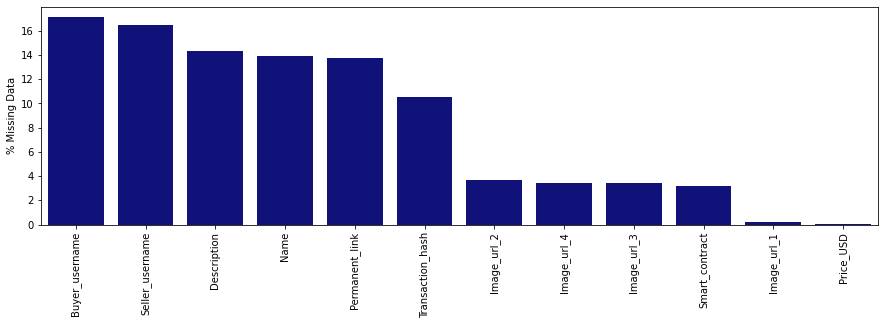

In [10]:
# Missing Values by Column
missing = df.isnull().sum()
pct_missing = missing/missing.sum()*100
pct_missing = pct_missing.sort_values(ascending=False)
pct_missing = pct_missing[pct_missing>0]

plt.figure(figsize=(15, 4))
sns.barplot(x=pct_missing.index, y=pct_missing, color='darkblue')
plt.ylabel('% Missing Data')
plt.xticks(rotation=90)
plt.show()


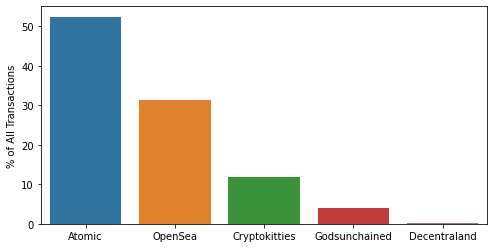

In [11]:
market_counts = df['Market'].value_counts(normalize=True)

plt.figure(figsize=(8, 4))
sns.barplot(x=market_counts.index, y=market_counts*100)
plt.ylabel('% of All Transactions')
plt.show()

In [12]:
# Number of different cryptocurrencies used
len(df['Crypto'].unique())

160

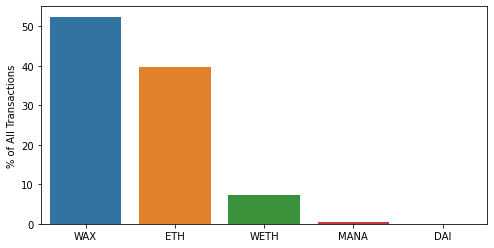

In [15]:

# Top 5 cryptocurrencies used
crypto_counts = pd.DataFrame( df['Crypto'].value_counts(normalize=True).head(5) )

plt.figure(figsize=(8, 4))
sns.barplot(x=crypto_counts.index, y=crypto_counts['Crypto']*100)
plt.ylabel('% of All Transactions')
plt.show()


In [16]:
# Unique Collections
len(df['Collection'].unique())

6283

In [17]:
# Unique NFTs
'{:,}'.format( len(df['ID_token'].unique()) )

'4,040,862'

In [18]:

tokens = df['Unique_id_collection'].value_counts()
print( '# of Tokens Sold Just Once =', '{:,}'.format( len(tokens[tokens==1]) ) )
print( '% of Tokens Sold Just Once =', round(len(tokens[tokens==1])/len(tokens)*100,1),'%' )

print( '\n# of Tokens Resold =', '{:,}'.format( len(tokens[tokens>1]) ) )
print( '% of Tokens Resold =', round(len(tokens[tokens>1])/len(tokens)*100,1),'%' )

# of Tokens Sold Just Once = 3,710,713
% of Tokens Sold Just Once = 79.3 %

# of Tokens Resold = 967,529
% of Tokens Resold = 20.7 %


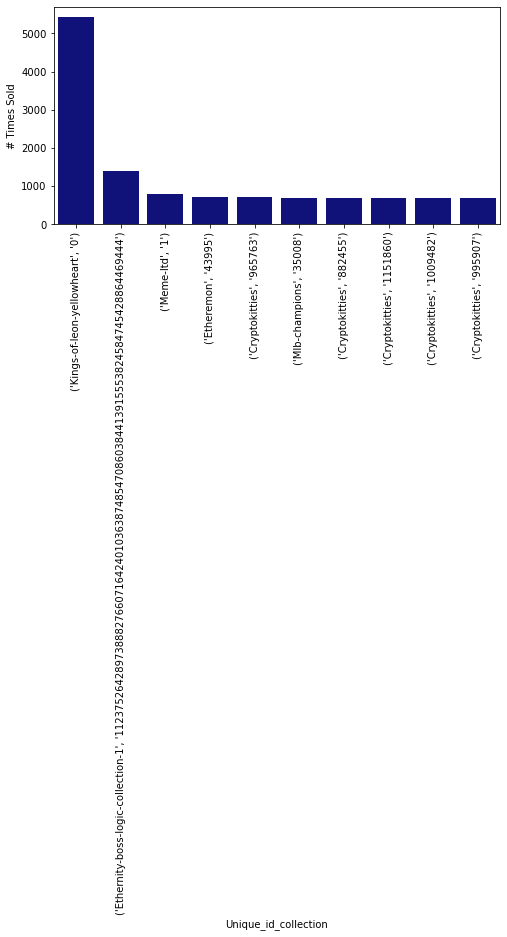

In [19]:
# Top 10 NFTs by Resale
plt.figure(figsize=(8, 4))
sns.barplot(x = tokens.head(10).index, y = tokens.head(10), order=tokens.head(10).index, color='darkblue')
plt.ylabel('# Times Sold')
plt.xlabel('Unique_id_collection')
plt.xticks(rotation=90)
plt.show()

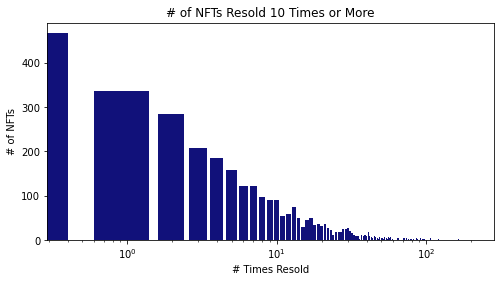

In [21]:
resale = tokens-1
resale_pcts = resale.value_counts()
resale_pcts1 = resale_pcts[resale_pcts.index>9]

plt.figure(figsize=(8, 4))
sns.barplot(x=resale_pcts1.index, y=resale_pcts1, color='darkblue').set_xscale('log')
plt.ylabel('# of NFTs')
plt.xlabel('# Times Resold')
plt.title('# of NFTs Resold 10 Times or More')
plt.show()

In [22]:

from neo4j import GraphDatabase
import pandas as pd

host = 'bolt://localhost:7687'
user = 'neo4j'
password = '12345'

In [23]:
driver = GraphDatabase.driver(host,auth=(user, password))

def neo4j_query(query, params=None):
    with driver.session() as session:
        result = session.run(query, params)
        return pd.DataFrame([r.values() for r in result], columns=result.keys())

In [25]:
neo4j_query("""
CALL apoc.warmup.run
""")


ServiceUnavailable: Couldn't connect to localhost:7687 (resolved to ('[::1]:7687', '127.0.0.1:7687')):
Failed to establish connection to ResolvedIPv6Address(('::1', 7687, 0, 0)) (reason [Errno 61] Connection refused)
Failed to establish connection to ResolvedIPv4Address(('127.0.0.1', 7687)) (reason [Errno 61] Connection refused)

In [43]:
neo4j_query("""
CALL apoc.meta.stats
YIELD nodeCount, relCount, labels
""")


,nodeCount,relCount,labels
0,11286844,22891323,"{'Category': 6, 'Transaction': 6071027, 'Trade..."


In [38]:
neo4j_query("""
MATCH (t:Transaction)
RETURN t.Datetime_updated.year AS year, 
       count(*) AS transactions, 
       sum(t.Price_USD) AS totalVolume, 
       avg(t.Price_USD) AS averagePrice
ORDER BY year 
""")

,year,transactions,totalVolume,averagePrice
0,2017,253100,1.829279e+07,72.274933
1,2018,449373,1.667865e+07,37.118441
2,2019,746489,1.867730e+07,25.086969
3,2020,1245954,7.762350e+07,62.551672
4,2021,3376111,7.559576e+08,223.996997


In [58]:
output = neo4j_query("""
CALL gds.graph.project.cypher("nft", 
"MATCH (t:Trader) WHERE NOT t.username = 'NullAddress' RETURN id(t) as id",
"MATCH (t1:Trader)-[:BOUGHT]->(t)<-[:SOLD]-(t2:Trader)
 RETURN id(t1) AS source, id(t2) as target, apoc.coll.max([sum(coalesce(t.Price_USD,0.1)),1]) as weight", {validateRelationships:false})
""")

In [59]:
output

,nodeQuery,relationshipQuery,graphName,nodeCount,relationshipCount,projectMillis
0,MATCH (t:Trader) WHERE NOT t.username = 'NullA...,MATCH (t1:Trader)-[:BOUGHT]->(t)<-[:SOLD]-(t2:...,nft2,70805,338639,253402


In [45]:
neo4j_query("""
MATCH p=(t:Trader)-[:BOUGHT]->()<-[:SOLD]-(t)
WHERE t.username = "grake"
RETURN [node in nodes(p) | node.Transaction_hash] AS result
LIMIT 10
""")

,result
0,"[None, 0xa5437ea384eebabfef3347606055cfbb9ff44..."
1,"[None, 0xf325fe3959979471bf5a14f74fc658663424e..."
2,"[None, 0xdf321ceee408d6a1fd7a44a624da393e373d6..."
3,"[None, 0x735d66b71a437da8ef2c3220b83d42ec5c7d5..."


In [62]:
df.columns

Index(['Smart_contract', 'ID_token', 'Transaction_hash', 'Seller_address',
       'Seller_username', 'Buyer_address', 'Buyer_username', 'Image_url_1',
       'Image_url_2', 'Image_url_3', 'Image_url_4', 'Price_Crypto', 'Crypto',
       'Price_USD', 'Name', 'Description', 'Collection', 'Market',
       'Datetime_updated', 'Datetime_updated_seconds', 'Permanent_link',
       'Unique_id_collection', 'Collection_cleaned', 'Category'],
      dtype='object')

In [64]:
len(df['ID_token'].unique())

4040862

In [87]:
len(df['Unique_id_collection'].unique())

4678242

In [75]:
len(df['Transaction_hash'].unique())

2180961

In [ ]:
df[]

In [79]:
len(df)

6071027

In [ ]:
b

In [89]:
df.describe()

,ID_token,Price_Crypto,Price_USD
count,6.071027e+06,6.071027e+06,6.062744e+06
mean,3.830578e+75,6.574200e+02,1.463413e+02
std,1.684663e+76,1.217706e+06,5.488389e+03
min,0.000000e+00,0.000000e+00,1.514250e-16
25%,1.286958e+06,2.400000e-02,2.277600e-01
50%,1.099514e+12,4.100000e-01,1.426470e+00
75%,1.099523e+12,5.000000e+00,1.385100e+01
max,1.157921e+77,3.000000e+09,7.501893e+06


In [11]:
transactions = df[df['Transaction_hash'] =='0xd0ff034f9080fe779aeb86c365347530abc725fbba123ee89e14ce7daeb4bd00']

In [17]:
transactions

,Smart_contract,ID_token,Transaction_hash,Seller_address,Seller_username,Buyer_address,Buyer_username,Image_url_1,Image_url_2,Image_url_3,...,Name,Description,Collection,Market,Datetime_updated,Datetime_updated_seconds,Permanent_link,Unique_id_collection,Collection_cleaned,Category
235559,NaN,10136853.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...,0x6958f5e95332d93d21af0d7b9ca85b8212fee0a5,NaN,0x1c012b03f1c2dea274d2eeeb566b0eeabfe3af1a,NaN,https://card.godsunchained.com/?id=402&q=2,NaN,NaN,...,NaN,NaN,Godsunchained,Godsunchained,2021-03-11,2021-03-11 01:40:41,NaN,"('Godsunchained', '10136853.0')",Godsunchained,Games
5854970,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,9876645.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...,0xc579e57351e561ff9d3229661c2d09cdb8e6f1d7,NaN,0x1c012b03f1c2dea274d2eeeb566b0eeabfe3af1a,NaN,https://lh3.googleusercontent.com/tiKn15yIjdVF...,https://card.godsunchained.com/?id=402&q=2&w=7...,https://lh3.googleusercontent.com/tiKn15yIjdVF...,...,Blessed Chimera ID #9876645,Deadly. Flank. Frontline. Protected. Ward.\nRo...,Gods-unchained,OpenSea,2021-03-11,2021-03-11 01:40:57,https://opensea.io/assets/0x0e3a2a1f2146d86a60...,"('Gods-unchained', '9876645')",Godsunchained,Games
5854971,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,9466317.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...,0x31d173ea66fa8fba38b3ddb798c1c1098f3ae8c5,NaN,0x1c012b03f1c2dea274d2eeeb566b0eeabfe3af1a,NaN,https://lh3.googleusercontent.com/tiKn15yIjdVF...,https://card.godsunchained.com/?id=402&q=2&w=7...,https://lh3.googleusercontent.com/tiKn15yIjdVF...,...,Blessed Chimera ID #9466317,Deadly. Flank. Frontline. Protected. Ward.\nRo...,Gods-unchained,OpenSea,2021-03-11,2021-03-11 01:40:59,https://opensea.io/assets/0x0e3a2a1f2146d86a60...,"('Gods-unchained', '9466317')",Godsunchained,Games
5854972,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,9831609.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...,0xd6a2977b737f6ab6b1899cf0b094464ae6216b15,ImportantClassicBuffaloOfEfficiency,0x1c012b03f1c2dea274d2eeeb566b0eeabfe3af1a,NaN,https://lh3.googleusercontent.com/tiKn15yIjdVF...,https://card.godsunchained.com/?id=402&q=2&w=7...,https://lh3.googleusercontent.com/tiKn15yIjdVF...,...,Blessed Chimera ID #9831609,Deadly. Flank. Frontline. Protected. Ward.\nRo...,Gods-unchained,OpenSea,2021-03-11,2021-03-11 01:40:55,https://opensea.io/assets/0x0e3a2a1f2146d86a60...,"('Gods-unchained', '9831609')",Godsunchained,Games
5854974,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,10173132.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...,0xe0fb7622091e3d9ef9b438471b10b9ea88c7cf6b,jezza,0x1c012b03f1c2dea274d2eeeb566b0eeabfe3af1a,NaN,https://lh3.googleusercontent.com/tiKn15yIjdVF...,https://card.godsunchained.com/?id=402&q=2&w=7...,https://lh3.googleusercontent.com/tiKn15yIjdVF...,...,Blessed Chimera ID #10173132,Deadly. Flank. Frontline. Protected. Ward.\nRo...,Gods-unchained,OpenSea,2021-03-11,2021-03-11 01:41:01,https://opensea.io/assets/0x0e3a2a1f2146d86a60...,"('Gods-unchained', '10173132')",Godsunchained,Games
5854975,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,10762353.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...,0xb8a501e8c738470230ff13a9b81877d46d93b037,NaN,0x1c012b03f1c2dea274d2eeeb566b0eeabfe3af1a,NaN,https://lh3.googleusercontent.com/tiKn15yIjdVF...,https://card.godsunchained.com/?id=402&q=2&w=7...,https://lh3.googleusercontent.com/tiKn15yIjdVF...,...,Blessed Chimera ID #10762353,Deadly. Flank. Frontline. Protected. Ward.\nRo...,Gods-unchained,OpenSea,2021-03-11,2021-03-11 01:41:04,https://opensea.io/assets/0x0e3a2a1f2146d86a60...,"('Gods-unchained', '10762353')",Godsunchained,Games
5854976,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,9548883.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...,0xd3e7e8cdc5f9c07bed4516901daa1d4a7c8e8bde,humusmandala,0x1c012b03f1c2dea274d2eeeb566b0eeabfe3af1a,NaN,https://lh3.googleusercontent.com/tiKn15yIjdVF...,https://card.godsunchained.com/?id=402&q=2&w=7...,https://lh3.googleusercontent.com/tiKn15yIjdVF...,..

In [82]:
transactions[['Smart_contract','ID_token','Transaction_hash']]

,Smart_contract,ID_token,Transaction_hash
235559,NaN,10136853.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...
5854970,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,9876645.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...
5854971,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,9466317.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...
5854972,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,9831609.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...
5854974,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,10173132.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...
5854975,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,10762353.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...
5854976,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,9548883.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...
5854977,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,10347021.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...
5854978,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,159650118.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...
5854979,0x0e3a2a1f2146d86a604adc220b4967a898d7fe07,11082609.0,0xd0ff034f9080fe779aeb86c365347530abc725fbba12...


In [94]:
df.groupby(['Unique_id_collection'])['Buyer_address'].count().nlargest(10)

Unique_id_collection
('Kings-of-leon-yellowheart', '0')                                                                                         5420
('Ethernity-boss-logic-collection-1', '112375264289738882766071642401036387485470860384413915553824584745428864469444')    1405
('Meme-ltd', '1')                                                                                                           796
('Etheremon', '43995')                                                                                                      711
('Cryptokitties', '965763')                                                                                                 704
('Mlb-champions', '35008')                                                                                                  701
('Cryptokitties', '882455')                                                                                                 696
('Cryptokitties', '1151860')                                                       

In [96]:
df[df['Unique_id_collection'] == "('Kings-of-leon-yellowheart', '0')"]

,Smart_contract,ID_token,Transaction_hash,Seller_address,Seller_username,Buyer_address,Buyer_username,Image_url_1,Image_url_2,Image_url_3,...,Name,Description,Collection,Market,Datetime_updated,Datetime_updated_seconds,Permanent_link,Unique_id_collection,Collection_cleaned,Category
5767243,0x557430421f8f3ed0a92aca211f1c05ad7b606288,0.0,0x2fc5b5867b782b821135ea26add6b54a13ace84b59e0...,0x95a08c297ad5861734c4440fd5ac6b80a8bf9228,YellowHeartFactories,0x41fd372e4558aba9b1e6bedf30494bf7c69c6cc9,ss21,https://lh3.googleusercontent.com/2JU0h9ePuFjK...,https://yellowheart-nft.s3.us-east-2.amazonaws...,https://lh3.googleusercontent.com/2JU0h9ePuFjK...,...,NFT Yourself,What comes with the NFT:\n\n1 - Digital album ...,Kings-of-leon-yellowheart,OpenSea,2021-03-20,2021-03-20 00:08:31,https://opensea.io/assets/0x557430421f8f3ed0a9...,"('Kings-of-leon-yellowheart', '0')",King,Art
5767259,0x557430421f8f3ed0a92aca211f1c05ad7b606288,0.0,0xcc54966ffb4ab60d1d1f51cc0857caf51f9866e117f5...,0x95a08c297ad5861734c4440fd5ac6b80a8bf9228,YellowHeartFactories,0x1dbc9a51174900551dff9649758b50215d60db29,NaN,https://lh3.googleusercontent.com/2JU0h9ePuFjK...,https://yellowheart-nft.s3.us-east-2.amazonaws...,https://lh3.googleusercontent.com/2JU0h9ePuFjK...,...,NFT Yourself,What comes with the NFT:\n\n1 - Digital album ...,Kings-of-leon-yellowheart,OpenSea,2021-03-20,2021-03-20 00:03:17,https://opensea.io/assets/0x557430421f8f3ed0a9...,"('Kings-of-leon-yellowheart', '0')",King,Art
5767264,0x557430421f8f3ed0a92aca211f1c05ad7b606288,0.0,0xdc84520e3dde24d487277d1ed6e4aa38f13fbcae0651...,0x95a08c297ad5861734c4440fd5ac6b80a8bf9228,YellowHeartFactories,0xb7a14918d936776e6fa57597f3dfb8b61a5d25ca,NaN,https://lh3.googleusercontent.com/2JU0h9ePuFjK...,https://yellowheart-nft.s3.us-east-2.amazonaws...,https://lh3.googleusercontent.com/2JU0h9ePuFjK...,...,NFT Yourself,What comes with the NFT:\n\n1 - Digital album ...,Kings-of-leon-yellowheart,OpenSea,2021-03-19,2021-03-19 23:59:39,https://opensea.io/assets/0x557430421f8f3ed0a9...,"('Kings-of-leon-yellowheart', '0')",King,Art
5767267,0x557430421f8f3ed0a92aca211f1c05ad7b606288,0.0,0x26f179bdc068e66da6f13bfaf3f8b0201ac19a229ee6...,0x95a08c297ad5861734c4440fd5ac6b80a8bf9228,YellowHeartFactories,0x6c67b9a0bae1968e8ddf939cb3e73976ef9026a4,gmancode,https://lh3.googleusercontent.com/2JU0h9ePuFjK...,https://yellowheart-nft.s3.us-east-2.amazonaws...,https://lh3.googleusercontent.com/2JU0h9ePuFjK...,...,NFT Yourself,What comes with the NFT:\n\n1 - Digital album ...,Kings-of-leon-yellowheart,OpenSea,2021-03-19,2021-03-19 23:59:37,https://opensea.io/assets/0x557430421f8f3ed0a9...,"('Kings-of-leon-yellowheart', '0')",King,Art
5767269,0x557430421f8f3ed0a92aca211f1c05ad7b606288,0.0,0x4a4303241fac1154a9d7a3feace7368fc9e2b6ce2dfa...,0x95a08c297ad5861734c4440fd5ac6b80a8bf9228,YellowHeartFactories,0xef77824a42200c897f724e50f382d4aba76ca7bc,Mark0in,https://lh3.googleusercontent.com/2JU0h9ePuFjK...,https://yellowheart-nft.s3.us-east-2.amazonaws...,https://lh3.googleusercontent.com/2JU0h9ePuFjK...,...,NFT Yourself,What comes with the NFT:\n\n1 - Digital album ...,Kings-of-leon-yellowheart,OpenSea,2021-03-19,2021-03-19 23:59:18,https://opensea.io/assets/0x557430421f8f3ed0a9...,"('Kings-of-leon-yellowheart', '0')",King,Art
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5904469,0x557430421f8f3ed0a92aca211f1c05ad7b606288,0.0,0xd378aad171436f0292d129bec8c679a7b61ed2f485f0...,0x95a08c297ad5861734c4440fd5ac6b80a8bf9228,YellowHeartFactories,0xe07e487d5a5e1098bbb4d259dac5ef83ae273f4e,kirkins,https://lh3.googleusercontent.com/2JU0h9ePuFjK...,https://yellowheart-nft.s3.us-east-2.amazonaws...,https://lh3.googleusercontent.com/2JU0h9ePuFjK...,...,NFT Yourself,What comes with the NFT:\n\n1 - Digital album ...,Kings-of-leon-yellowheart,OpenSea,2021-03-05,2021-03-05 17:01:20,https://opensea.io/assets/0x557430421f8f3ed0a9...,"('Kings-of-leon-yellowheart', '0')",King,Art
5904471,0x557430421f8f3ed0a92aca211f1c05ad7b606288,

In [143]:
kings_of_leon = df[df['Unique_id_collection'] == "('Kings-of-leon-yellowheart', '0')"].sort_values(by='Datetime_updated_seconds', ascending=True)[['Datetime_updated_seconds', 'Price_USD']]

In [144]:
kings_of_leon

,Datetime_updated_seconds,Price_USD
5904474,2021-03-05 17:01:06,52.374525
5904473,2021-03-05 17:01:07,972.669750
5904472,2021-03-05 17:01:07,2469.084750
5904471,2021-03-05 17:01:11,52.374525
5904468,2021-03-05 17:01:17,972.669750
...,...,...
5767269,2021-03-19 23:59:18,62.562850
5767267,2021-03-19 23:59:37,62.562850
5767264,2021-03-19 23:59:39,62.562850
5767259,2021-03-20 00:03:17,64.223775


In [166]:
kings_of_leon[ 'rolling_avg' ] = kings_of_leon['Price_USD'].rolling(200).mean()

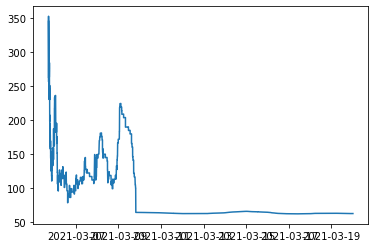

In [167]:
plt.plot(kings_of_leon['Datetime_updated_seconds'], kings_of_leon['rolling_avg'])

In [163]:
etheremon = df[df['Unique_id_collection'] == "('Etheremon', '43995')"].sort_values(by='Datetime_updated_seconds', ascending=True)[['Datetime_updated_seconds', 'Price_USD']]

In [168]:
etheremon[ 'rolling_avg' ] = etheremon['Price_USD'].rolling(10).mean()

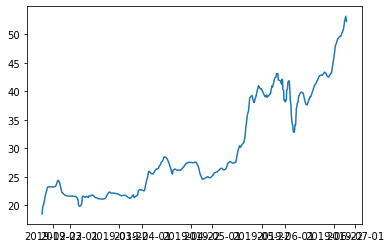

In [169]:
plt.plot(etheremon['Datetime_updated_seconds'], etheremon['rolling_avg'])

In [210]:
df.groupby(['Collection'])['Buyer_address'].count().nlargest(100)

Collection
alien.worlds      1288810
Cryptokitties     1092177
Gods-unchained     383965
stf.capcom         318737
kogsofficial       300854
                   ...   
skullhead225         2732
sometimesnft         2717
Cryptospells         2645
freshydroppy         2637
Cryptoassault        2627
Name: Buyer_address, Length: 100, dtype: int64

In [11]:
top_100 = []
for key, values in df.groupby(['Collection'])['Buyer_address'].count().nlargest(100).items():
    top_100.append(key)

In [12]:
top_100

['alien.worlds',
 'Cryptokitties',
 'Gods-unchained',
 'stf.capcom',
 'kogsofficial',
 'Sorare',
 'mlb.topps',
 'Godsunchained',
 'Axie',
 'Rarible',
 'officialhero',
 'gpk.topps',
 'cartombs.r2',
 '0xuniverse',
 'upland.cards',
 'pepe',
 'Mycryptoheroes',
 'ultrahorrors',
 'gdz.topps',
 'mutants.r2',
 'nimoy',
 'Mlb-champions',
 'darkcountryh',
 'atari',
 'rplanet',
 'bitverse',
 'Decentraland',
 'Knightstory',
 'crptomonkeys',
 'bitcoinorign',
 'monsters.r2',
 'splintrlands',
 'Superrare',
 'Cryptospacecommanders',
 'byronartset1',
 'exitlimbowax',
 'Etheremon',
 'Hashmasks',
 'deadmau5',
 'colonizemars',
 'hodlgod',
 'Ens',
 'vancitycomic',
 'upliftart',
 'Decentraland-wearables',
 'boxmazeonwax',
 'Art-blocks',
 'Blockchaincuties',
 'Makersplace',
 'Brave-frontier-heroes',
 'Sandbox',
 'bitcoinelite',
 'Cryptopunks',
 'gnomeseries1',
 'Cryptovoxels',
 'tribalbooks',
 'Wrapped-mooncatsrescue',
 'starcardscpt',
 'twobontanica',
 'Kings-of-leon-yellowheart',
 'niftywizards',
 'Meme-lt

In [33]:
df.groupby(['Collection'])['Buyer_address'].sort_values(by='Datetime_updated_seconds', ascending=True)[['Datetime_updated_seconds', 'Price_USD']]

AttributeError: 'SeriesGroupBy' object has no attribute 'sort_values'

In [13]:
top_100_df = df.loc[df['Collection'].isin(top_100)]

In [15]:
 collection_group_by_date = top_100_df.groupby(['Collection', 'Datetime_updated']).mean()

In [66]:
collection_group_by_date

ID_token  Price_Crypto  Price_USD
Collection   Datetime_updated                                       
0xuniverse   2018-09-13        6.812542e+03      0.028750   5.720531
             2018-09-14        3.148800e+03      0.042500   9.069075
             2018-09-15        3.568500e+03      0.033323   7.265178
             2018-09-20        6.455000e+03      0.054175  11.806457
             2018-10-03        1.066700e+04      0.040000   8.854200
...                                     ...           ...        ...
waxartncards 2021-04-24        1.099524e+12      1.097778   0.195598
             2021-04-25        1.099528e+12      1.786040   0.331913
             2021-04-26        1.099528e+12      0.720429   0.141909
             2021-04-27        1.099529e+12      0.360572   0.070892
weezer       2021-04-27        1.099530e+12     16.626586   3.174432

[25691 rows x 3 columns]

In [ ]:
#not needed
# collection_group_by_date_rolling =top_100_df.groupby(['Collection', 'Datetime_updated'])['Price_USD'].transform(lambda x: x.rolling(10, 1)).mean()

In [65]:
collection_group_by_date['Price_USD']

Collection    Datetime_updated
0xuniverse    2018-09-13           5.720531
              2018-09-14           9.069075
              2018-09-15           7.265178
              2018-09-20          11.806457
              2018-10-03           8.854200
                                    ...    
waxartncards  2021-04-24           0.195598
              2021-04-25           0.331913
              2021-04-26           0.141909
              2021-04-27           0.070892
weezer        2021-04-27           3.174432
Name: Price_USD, Length: 25691, dtype: float64

In [48]:
price_of_top100 = pd.DataFrame({'price_usd' : collection_group_by_date['Price_USD']}).reset_index()

In [49]:
price_of_top100

,Collection,Datetime_updated,price_usd
0,0xuniverse,2018-09-13,5.720531
1,0xuniverse,2018-09-14,9.069075
2,0xuniverse,2018-09-15,7.265178
3,0xuniverse,2018-09-20,11.806457
4,0xuniverse,2018-10-03,8.854200
...,...,...,...
25686,waxartncards,2021-04-24,0.195598
25687,waxartncards,2021-04-25,0.331913
25688,waxartncards,2021-04-26,0.141909
25689,waxartncards,2021-04-27,0.070892


In [44]:
#price_of_top100['rolling_price_usd'] = price_of_top100['price_usd'].rolling(10).mean()

In [53]:
collection_rolling_average = price_of_top100.groupby('Collection')['price_usd'].rolling(10, min_periods=1).mean()

In [67]:
price_of_top100_rolling = pd.DataFrame({'price_usd_rolling' : collection_rolling_average }).reset_index()

In [68]:
price_of_top100 = pd.DataFrame({'price_usd' : collection_group_by_date['Price_USD']}).reset_index()

In [69]:
price_of_top100

,Collection,Datetime_updated,price_usd
0,0xuniverse,2018-09-13,5.720531
1,0xuniverse,2018-09-14,9.069075
2,0xuniverse,2018-09-15,7.265178
3,0xuniverse,2018-09-20,11.806457
4,0xuniverse,2018-10-03,8.854200
...,...,...,...
25686,waxartncards,2021-04-24,0.195598
25687,waxartncards,2021-04-25,0.331913
25688,waxartncards,2021-04-26,0.141909
25689,waxartncards,2021-04-27,0.070892


In [70]:
price_of_top100_rolling

,Collection,level_1,price_usd_rolling
0,0xuniverse,0,5.720531
1,0xuniverse,1,7.394803
2,0xuniverse,2,7.351595
3,0xuniverse,3,8.465310
4,0xuniverse,4,8.543088
...,...,...,...
25686,waxartncards,25686,0.336030
25687,waxartncards,25687,0.304338
25688,waxartncards,25688,0.228243
25689,waxartncards,25689,0.226911


In [73]:
price_of_top100['price_usd_rolling'] = price_of_top100_rolling['price_usd_rolling']

In [41]:
collection_group_by_date

In [30]:
df.groupby(['Collection'])['Price_USD']

<AxesSubplot:xlabel='Datetime_updated', ylabel='price_usd'>

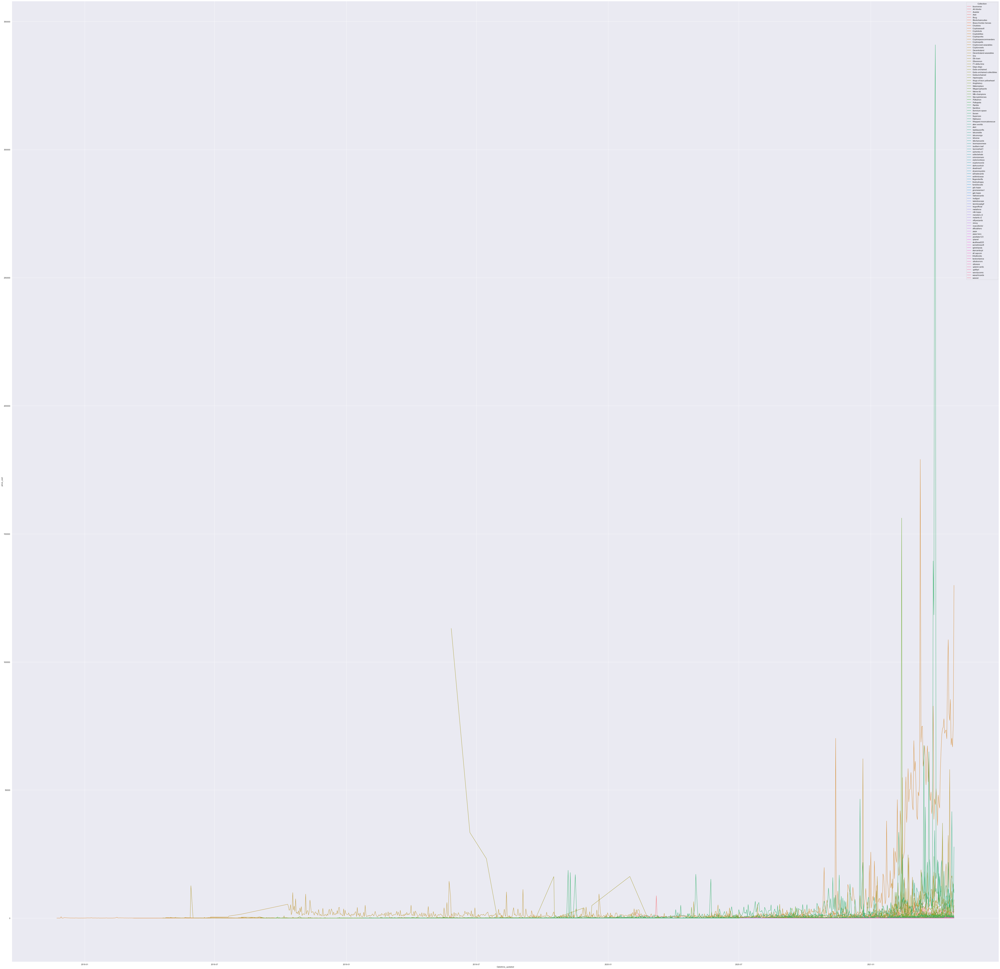

In [84]:
import seaborn as sns
sns.set(rc={"figure.figsize":(100, 100)}) 
sns.lineplot(data=price_of_top100, x='Datetime_updated', y='price_usd', hue='Collection')

In [74]:
price_of_top100

,Collection,Datetime_updated,price_usd,price_usd_rolling
0,0xuniverse,2018-09-13,5.720531,5.720531
1,0xuniverse,2018-09-14,9.069075,7.394803
2,0xuniverse,2018-09-15,7.265178,7.351595
3,0xuniverse,2018-09-20,11.806457,8.465310
4,0xuniverse,2018-10-03,8.854200,8.543088
...,...,...,...,...
25686,waxartncards,2021-04-24,0.195598,0.336030
25687,waxartncards,2021-04-25,0.331913,0.304338
25688,waxartncards,2021-04-26,0.141909,0.228243
25689,waxartncards,2021-04-27,0.070892,0.226911


<AxesSubplot:xlabel='Datetime_updated', ylabel='price_usd_rolling'>

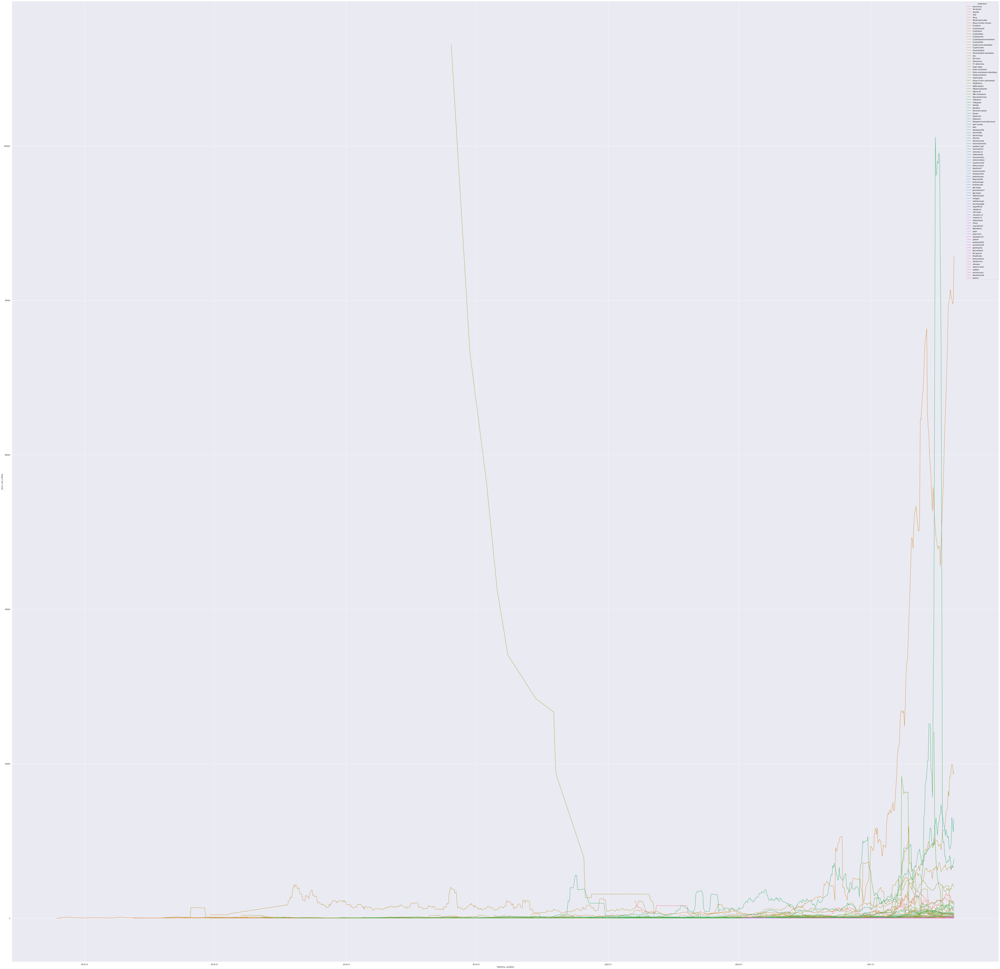

In [83]:
import seaborn as sns
sns.set(rc={"figure.figsize":(100, 100)}) 
sns.lineplot(data=price_of_top100, x='Datetime_updated', y='price_usd_rolling', hue='Collection')

In [88]:
import altair as alt
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [96]:
selection = alt.selection_multi(fields=["Collection"], bind="legend")
alt.Chart(price_of_top100).mark_line().encode(
    x="Datetime_updated",
    y="price_usd_rolling",
    color=alt.Color('Collection', legend=alt.Legend(columns=1, symbolLimit=0)),
    opacity=alt.condition(selection, alt.value(1), alt.value(0.1))
).properties(
   height=3000, width=5000
).add_selection(
   selection
)

alt.Chart(...)

In [106]:
hover = alt.selection(
   type="single", on="mouseover", fields=["Collection"], nearest=True
)
# line plot
lineplot = alt.Chart(price_of_top100).mark_line().encode(
    x="Datetime_updated",
    y="price_usd_rolling",
    color=alt.Color('Collection', legend=alt.Legend(columns=1, symbolLimit=0)),
).properties(
   height=3000, width=5000
)
# nearest point
point = lineplot.mark_circle().encode(opacity=alt.value(0)).add_selection(hover)
# highlight
singleline = lineplot.mark_line().encode(
   size=alt.condition(~hover, alt.value(0.5), alt.value(3))
)
point + singleline

alt.LayerChart(...)

In [108]:
## subdivide 
## above 5000
## above 1000 < 5000
## above 500 below $1000
## below 500

In [138]:
max_by_collection = price_of_top100.groupby(['Collection'])['price_usd'].max()

In [139]:
max_by_collection

Collection
0xuniverse      1277.088855
Art-blocks      6176.202698
Avastar         8889.558817
Axie            1010.491946
Bccg            6249.985893
                   ...     
upland.cards     188.480099
upliftart        240.063536
vancitycomic      55.682167
waxartncards       2.089363
weezer             3.174432
Name: price_usd, Length: 100, dtype: float64

In [183]:
above_3000 = max_by_collection.index[max_by_collection >= 3000]
len(above_3000)

24

In [185]:
above_500 = max_by_collection.index[(max_by_collection >= 500) &  (max_by_collection < 3000) ]
len(above_1000)

24

In [186]:
above_50 = max_by_collection.index[(max_by_collection >= 50) &  (max_by_collection < 500) ]
len(above_500)

24

In [189]:
less_than_50 = max_by_collection.index[max_by_collection < 50]
len(less_than_50)

28

In [188]:
price_of_top100.loc[price_of_top100['Collection'].isin(above_3000)]

,Collection,Datetime_updated,price_usd,price_usd_rolling
547,Art-blocks,2020-11-27,135.811348,135.811348
548,Art-blocks,2020-11-28,131.368130,133.589739
549,Art-blocks,2020-11-29,147.472046,138.217175
550,Art-blocks,2020-11-30,330.998900,186.412606
551,Art-blocks,2020-12-01,72.869405,163.703966
...,...,...,...,...
18632,Superrare,2021-04-23,7959.555146,9682.625176
18633,Superrare,2021-04-24,41593.279478,13062.328263
18634,Superrare,2021-04-25,2677.137496,12197.325039
18635,Superrare,2021-04-26,2304.871116,11148.581734


In [ ]:
## somnium-space might be scam 
## meme-ltd potentially problematic, needs further investigation. 

In [197]:
selection = alt.selection_multi(fields=["Collection"], bind="legend")
alt.Chart(price_of_top100.loc[price_of_top100['Collection'].isin(above_3000)]).mark_line().encode(
    x="Datetime_updated",
    y="price_usd",
    color=alt.Color('Collection', legend=alt.Legend(columns=1, symbolLimit=0)),
    opacity=alt.condition(selection, alt.value(1), alt.value(0.1))
).properties(
   height=600, width=1000
).add_selection(
   selection
)

alt.Chart(...)

#chubbies is a scam
https://medium.com/boxswap/chubbies-nft-art-gets-stolen-and-then-sold-for-3-2-million-dollars-in-eth-f0ee6d559d0a

# alien.worlds
https://www.reddit.com/r/AlienWorldsio/comments/n97wm7/nft_scam_site_including_alien_worlds/

# Pepe NFT Potential fraud

In [196]:
selection = alt.selection_multi(fields=["Collection"], bind="legend")
alt.Chart(price_of_top100.loc[price_of_top100['Collection'].isin(above_500)]).mark_line().encode(
    x="Datetime_updated",
    y="price_usd",
    color=alt.Color('Collection', legend=alt.Legend(columns=1, symbolLimit=0)),
    opacity=alt.condition(selection, alt.value(1), alt.value(0.1))
).properties(
   height=600, width=1000
).add_selection(
   selection
)

alt.Chart(...)

In [194]:
selection = alt.selection_multi(fields=["Collection"], bind="legend")
alt.Chart(price_of_top100.loc[price_of_top100['Collection'].isin(above_50)]).mark_line().encode(
    x="Datetime_updated",
    y="price_usd",
    color=alt.Color('Collection', legend=alt.Legend(columns=1, symbolLimit=0)),
    opacity=alt.condition(selection, alt.value(1), alt.value(0.1))
).properties(
   height=600, width=1000
).add_selection(
   selection
)

alt.Chart(...)

In [193]:
selection = alt.selection_multi(fields=["Collection"], bind="legend")
alt.Chart(price_of_top100.loc[price_of_top100['Collection'].isin(less_than_50)]).mark_line().encode(
    x="Datetime_updated",
    y="price_usd",
    color=alt.Color('Collection', legend=alt.Legend(columns=1, symbolLimit=0)),
    opacity=alt.condition(selection, alt.value(1), alt.value(0.1))
).properties(
   height=600, width=1000
).add_selection(
   selection
)

alt.Chart(...)